## 2.2 Rasterdaten herunterladen

In [1]:
import os
import geopandas as gpd
import shapely
import geopandas_stac as stac 
import urllib.request
import geoutils
import numpy as np
import matplotlib.pyplot as plt
import rasterio

stac.getCollectionList(cache=True)

['ch.bazl.luftfahrtkarten-icao',
 'ch.bazl.segelflugkarte',
 'ch.swisstopo.geoidmodell-ch1903',
 'ch.swisstopo.landeskarte-farbe-10',
 'ch.swisstopo.pixelkarte-farbe-pk100.noscale',
 'ch.swisstopo.pixelkarte-farbe-pk200.noscale',
 'ch.swisstopo.pixelkarte-farbe-pk25.noscale',
 'ch.swisstopo.pixelkarte-farbe-pk50.noscale',
 'ch.swisstopo.swissalti3d',
 'ch.swisstopo.swissbathy3d',
 'ch.swisstopo.swissboundaries3d',
 'ch.swisstopo.swissbuildings3d_2',
 'ch.swisstopo.swissimage-dop10',
 'ch.swisstopo.swissnames3d',
 'ch.swisstopo.swisssurface3d',
 'ch.swisstopo.swisssurface3d-raster',
 'ch.swisstopo.swisstlm3d',
 'ch.swisstopo.swisstlmregio']

In [2]:
df = stac.getAssets("ch.swisstopo.pixelkarte-farbe-pk25.noscale")
df_krel = df.query('variant == "krel"') # Farbkombination MIT Relief (indizierte Farben)

kantone = gpd.read_file("daten/gemeindegrenzen/ggg_2021-LV95/shp/g1k21.shp", encoding="utf-8")
kantone = kantone.to_crs("EPSG:4326")

poly_gpd = kantone.query('KTNAME == "Basel-Stadt"')
df_daten_basel_stadt = gpd.sjoin(df_krel, poly_gpd, op='intersects')
urls = stac.getUrlList(df_daten_basel_stadt)
urls

['https://data.geo.admin.ch/ch.swisstopo.pixelkarte-farbe-pk25.noscale/swiss-map-raster25_2018_1047/swiss-map-raster25_2018_1047_krel_1.25_2056.tif',
 'https://data.geo.admin.ch/ch.swisstopo.pixelkarte-farbe-pk25.noscale/swiss-map-raster25_2018_1067/swiss-map-raster25_2018_1067_krel_1.25_2056.tif']

In [3]:
if not os.path.exists("daten/basel_pk25"):
    os.mkdir("daten/basel_pk25")

In [4]:
for url in urls:
    filename = os.path.basename(url)
    print(filename)

swiss-map-raster25_2018_1047_krel_1.25_2056.tif
swiss-map-raster25_2018_1067_krel_1.25_2056.tif


In [5]:
for url in urls:
    filename = "daten/basel_pk25/" + os.path.basename(url)
    geoutils.download(url, filename, False)

100% done 	[****************************************************************************************************]
100% done 	[****************************************************************************************************]


In [6]:
for url in urls:
    filename = "daten/basel_pk25/" + os.path.basename(url)

    dataset = rasterio.open(filename)

    w = dataset.width
    h = dataset.height
    dt = dataset.dtypes

    print(w,h, filename)

    dataset.close()

14000 9600 daten/basel_pk25/swiss-map-raster25_2018_1047_krel_1.25_2056.tif
14000 9600 daten/basel_pk25/swiss-map-raster25_2018_1067_krel_1.25_2056.tif


#### GDAL Tools

Wir können die Bilder nun "virtuell" zusammensetzen mit dem Tool ``gdalbuildvrt``

https://gdal.org/programs/gdalbuildvrt.html

Es gibt zahlreiche weitere Hilfsprogramme, https://gdal.org/programs/index.html
Diese wurden bei der Installation von rasterio mitinstalliert (Abhängigkeit gdal)


GDAL wird automatisch mit rasterio installiert

In [7]:
!gdalbuildvrt daten/basel_pk25.vrt daten/basel_pk25/*.tif

0...10...20...30...40...50...60...70...80...90...100 - done.


In [9]:
# lokal evtl so:
# !gdalbuildvrt.exe daten/basel_pk25.vrt daten/basel_pk25/*.tif

In [8]:
file = open("daten/basel_pk25.vrt")
vrt = file.read()
file.close()

print(vrt)

<VRTDataset rasterXSize="14000" rasterYSize="19200">
  <SRS>PROJCS["CH1903+ / LV95",GEOGCS["CH1903+",DATUM["CH1903+",SPHEROID["Bessel 1841",6377397.155,299.1528128,AUTHORITY["EPSG","7004"]],TOWGS84[674.374,15.056,405.346,0,0,0,0],AUTHORITY["EPSG","6150"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4150"]],PROJECTION["Hotine_Oblique_Mercator_Azimuth_Center"],PARAMETER["latitude_of_center",46.95240555555556],PARAMETER["longitude_of_center",7.439583333333333],PARAMETER["azimuth",90],PARAMETER["rectified_grid_angle",90],PARAMETER["scale_factor",1],PARAMETER["false_easting",2600000],PARAMETER["false_northing",1200000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","2056"]]</SRS>
  <GeoTransform>  2.6025000000000000e+06,  1.2500000000000000e+00,  0.0000000000000000e+00,  1.2780000000000000e+06,  0.0000000000000000e+00, -1.2500000000000000e+00</GeoTransform>


# Erstellen von Pyramidenstufen ("Overviews") auf dem virtuellen Datensatz

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/4/43/Image_pyramid.svg/480px-Image_pyramid.svg.png"></img>
(Bildquelle: Wikimedia)


Kann auch anstall shellkommando von Python aufgerufen werden (in einem Skript):

    import os

    filename = "XYZ.tif"
    command = f"gdaladdo -r average {filename} 2 4 8 16 32"
    os.system(command);


Dieses Format ist zu bevorzugen für die Anzeige in QGIS (anstelle von vrt) ==> zoomen geht schneller und schöner

In [10]:
!gdaladdo -r average daten/basel_pk25.vrt 2 4 8 16 32

0...10...20...30...40...50...60...70...80...90...100 - done.


In [11]:
# lokal evtl:
#!gdaladdo.exe -r average daten/basel_pk25.vrt 2 4 8 16 32

Nun haben wir auch eine Bildpyramide gespeichert in: basel_pk25.vrt.ovr

In [12]:
dataset = rasterio.open("daten/basel_pk25.vrt")

w = dataset.width
h = dataset.height
dt = dataset.dtypes

print(w,h)

14000 19200


In [13]:
B = w*h*3
KiB = B/1024
MiB = KiB/1024
GiB = MiB/1024

print(GiB, "GiB")

0.7510185241699219 GiB


### Teil des Bildes extrahieren


Basler Münster in die Mitte des Plot schieben

In [14]:
pos = (2_611_586.761, 1_267_327.342) ## Basler Münster, LV95 Koordinate (ohne _ geht auch)

In [15]:
# center in pixels:

center = ~dataset.transform * pos
print(center)

(7269.408800000092, 8538.12639999995)


In [16]:
# calculate upper left of new image:
width = 500   
height = 500 # pixel

upper_left = (int(center[0] - width/2), int(center[1] - height/2))
print(upper_left)

(7019, 8288)


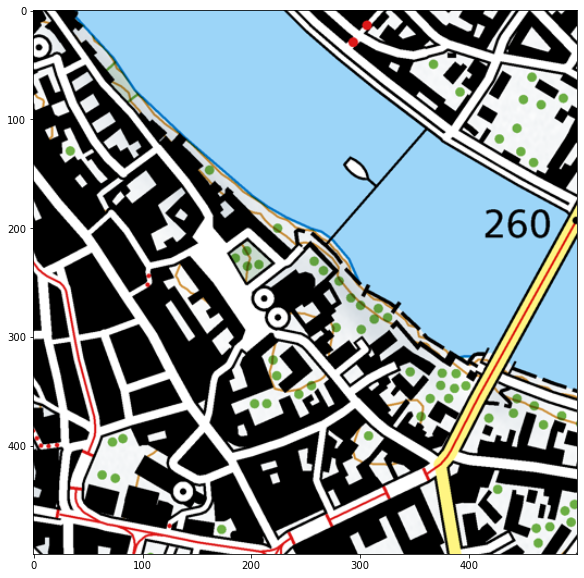

In [17]:
from rasterio.windows import Window

w = Window(upper_left[0], upper_left[1], width, height)

r = dataset.read(1, window=w)
g = dataset.read(2, window=w)
b = dataset.read(3, window=w)


image_rgb = np.dstack((r,g,b)) # zur Dastellung in RGB tuple konvertieren
fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(image_rgb, interpolation='bilinear');
plt.show()

#### Export als GeoTiff

Achtung: Das ist relativ mühsam, da wir eine neue Affintransformation rechnern müssen.

* Neues Worldfile generieren (Affintransformation)
* File schreiben

In [18]:
dataset.transform

Affine(1.25, 0.0, 2602500.0,
       0.0, -1.25, 1278000.0)

In [19]:
ul = dataset.transform * upper_left
print(f"Upper Left LV95: ({ul[0]:_}, {ul[1]:_})")

Upper Left LV95: (2_611_273.75, 1_267_640.0)


In [20]:
# New Affine Transformation:
t = rasterio.Affine(dataset.transform[0],dataset.transform[1],ul[0],
                    dataset.transform[3],dataset.transform[4],ul[1])

t

Affine(1.25, 0.0, 2611273.75,
       0.0, -1.25, 1267640.0)

Nun müssen wir das umgekehrte von dstack machen: Kanalweises extrahieren der Daten:

In [21]:
red = image_rgb[:,:,0]  
green = image_rgb[:,:,1] 
blue = image_rgb[:,:,2] 

In [22]:
dataset_out =  rasterio.open("daten/basel_export.tif", "w", driver='GTiff', width=width, height=height, count=3, dtype=image_rgb.dtype, transform=t)
#Write channels:
dataset_out.write(red, indexes=1)
dataset_out.write(green, indexes=2)
dataset_out.write(blue, indexes=3)

dataset_out = None

### swissimage Download über einen grösseren Bereich

<a href="https://map.geo.admin.ch/?lang=en&topic=ech&bgLayer=ch.swisstopo.pixelkarte-farbe&layers=ch.swisstopo.zeitreihen,ch.bfs.gebaeude_wohnungs_register,ch.bav.haltestellen-oev,ch.swisstopo.swisstlm3d-wanderwege,ch.astra.wanderland-sperrungen_umleitungen,KML%7C%7Chttps:%2F%2Fpublic.geo.admin.ch%2Fp3Ih91bqTRuul4XjC0PIcg&layers_opacity=1,1,1,0.8,0.8,1&layers_visibility=false,false,false,false,false,true&layers_timestamp=18641231,,,,,&E=2678450&N=1209850&zoom=4&crosshair=marker">map.geo.admin.ch: Ausschnitt Rigi</a>


In [23]:
wkt = 'POLYGON ((8.37645402594779 47.09477897404989, 8.543027723323302 47.09194937593571, 8.539901799919873 46.97188385130637, 8.371713837783513 46.97382585920817, 8.37645402594779 47.09477897404989))'

In [24]:
urls = stac.getSwissimage_poly(wkt)

In [25]:
len(urls)

195

In [26]:
datasetname = "rigi"

# Wenn lokal: Dieser Ordner muss angepasst werden, z.B. "daten/img" 
basedir = "/data/geo/opengeodata/img/"
basedir2 = f"{basedir}{datasetname}/"


if not os.path.exists(basedir):
    os.makedirs(basedir)

if not os.path.exists(basedir2):
    os.makedirs(basedir2)

#### Alle Bilder herunterladen (falls noch nicht vorhanden)

In [27]:
for url in urls:
    filename = basedir2 + os.path.basename(url)
    geoutils.download(url, filename, False)  # mit dem False wird verhindert, dass neu heruntergeladen wird

File https://data.geo.admin.ch/ch.swisstopo.swissimage-dop10/swissimage-dop10_2019_2683-1216/swissimage-dop10_2019_2683-1216_0.1_2056.tif already exists, not overwriting.          

#### Overviews/Pyramiden entfernen (Speicherplatz sparen)

In [28]:
#for url in urls:
#    filename = basedir2 + os.path.basename(url)
#    !gdaladdo -clean $filename

#### Virtuellen Datensatz (vrt) erstellen

In [29]:
tifs = f"{basedir2}*.tif"
vrt = f"{basedir}{datasetname}.vrt"

print(f"Erstelle vrt: {vrt}\ntif aus dem Ordner: {tifs}")


Erstelle vrt: /data/geo/opengeodata/img/rigi.vrt
tif aus dem Ordner: /data/geo/opengeodata/img/rigi/*.tif


In [ ]:
#!gdalbuildvrt $vrt $tifs

#### Overviews / Bildpyramiden erstellen

Dies dauert eine Weile!

In [ ]:
#!gdaladdo -r average $vrt 2 4 8 16 32

#### Skalieren

In [30]:
output = "daten/" + datasetname + ".tif"
output

'daten/rigi.tif'

In [31]:
!gdal_translate -of GTiff $vrt $output -outsize 2000 0 -a_srs EPSG:2056 #0: automatisches Bildverhältnis von vorher

Input file size is 130000, 150000
0...10...20...30...40...50...60...70...80...90...100 - done.


#### Darstellen der Daten

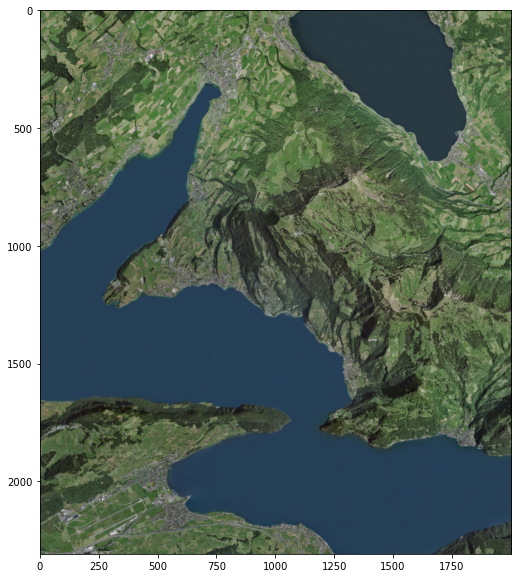

In [32]:
import rasterio.plot

dataset = rasterio.open(output)
image_rgb = np.dstack((dataset.read(1),dataset.read(2),dataset.read(3)))
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(image_rgb, interpolation='bilinear');
plt.show()
dataset.close()

#### In Folium (nur mit kleinen Bildern!!)

In [33]:
output_wgs84 = "daten/" + datasetname + "_wgs84.tif"
output_wgs84

'daten/rigi_wgs84.tif'

In [34]:
output_wgs84_png = "daten/" + datasetname + "_wgs84.png"
output_wgs84_png

'daten/rigi_wgs84.png'

##### Nach WGS84 transformieren

In [36]:
!gdalwarp -s_srs EPSG:2056 -t_srs EPSG:4326 $output $output_wgs84 # source srs nach target srs

Processing daten/rigi.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.


##### Nach PNG Konvertieren, wiel Webbrowser Tif's nicht darstellen können

In [37]:
!gdal_translate -of PNG -ot Byte $output_wgs84 $output_wgs84_png 

Input file size is 2445, 1922
0...10...20...30...40...50...60...70...80...90...100 - done.


In [38]:
dataset = rasterio.open(output_wgs84)
dataset.bounds

BoundingBox(left=8.371565438718335, bottom=46.96377493601434, right=8.545109641691003, top=47.100197004772404)

In [39]:
bounds = [[dataset.bounds.bottom, dataset.bounds.left], [dataset.bounds.top, dataset.bounds.right]]
bounds

[[46.96377493601434, 8.371565438718335],
 [47.100197004772404, 8.545109641691003]]

In [40]:
import os
import folium


m = folium.Map([46.95, 8.37], zoom_start=8, tiles="stamentoner")


img = folium.raster_layers.ImageOverlay(
        name="Img",
        image=output_wgs84_png,
        bounds=bounds,
        opacity=0.6,
        interactive=True,
        cross_origin=False,
        zindex=1,
    )

folium.Popup("I am an image").add_to(img)

img.add_to(m)
folium.LayerControl().add_to(m)

m

Verzerrt, weil umgerechnet auf WGS84